# Background correction
Background was estimated by median filter with quite large kernel (51x51 px). To correct the background, we substructed estimaded median value from the original image.
Please note that background estimate calculation are slow. (For the stationary computer one frame takes approximately 4 minutes)
The result for particular Omero image ID presented below.

This procedure works good only till approximately 48 frames (4 hours), then the biofilm structure exceed (51x51) kernel and require background correction with larger kernel.

In [1]:
from glob import glob
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

import skimage
from skimage import util
import skimage.io as io
from skimage import exposure


import warnings
warnings.filterwarnings('ignore')

import sys

plt.rcParams['figure.figsize'] = (5.0, 4.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

In [2]:
file_name="42834_chanel_1_SideLight.tif"
file=file_name.split('.tif')[0]
orig=io.imread("../data/"+file_name)
corrected_bg=io.imread("../data/"+file+"_corrected.tif")
bg=io.imread("../data/"+file+"_bg.tif")

## Viz images before and after correction

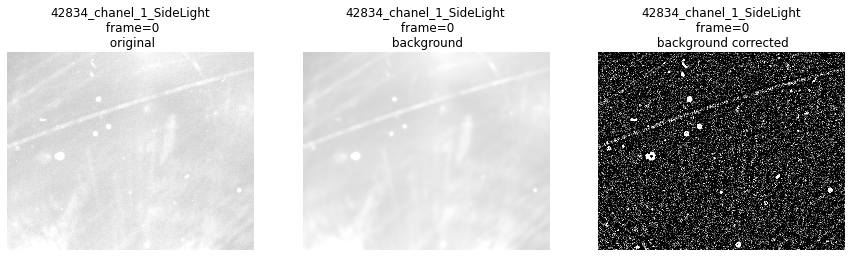

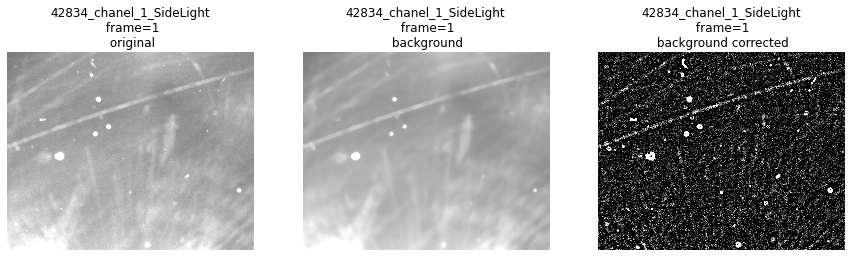

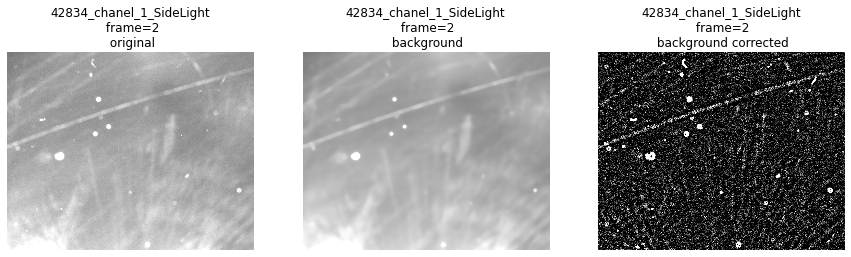

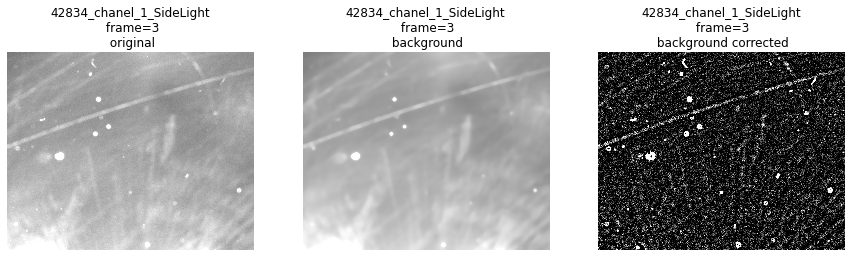

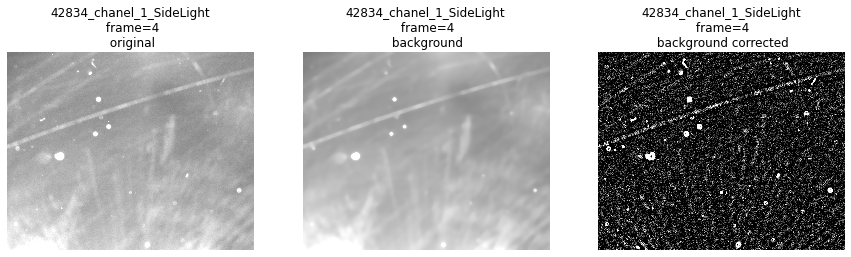

...

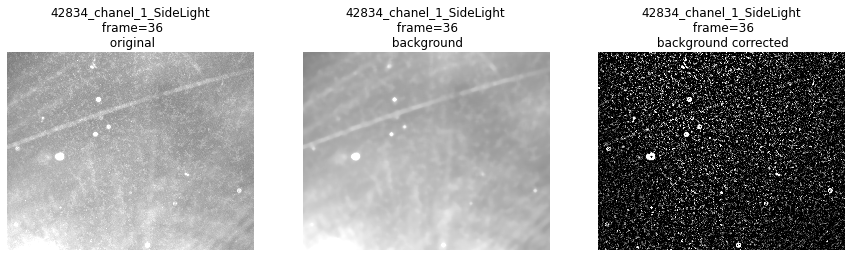

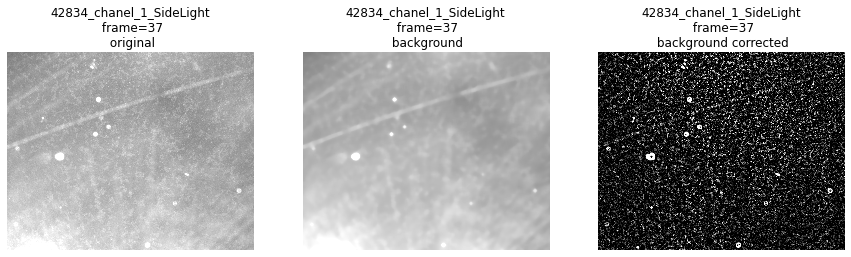

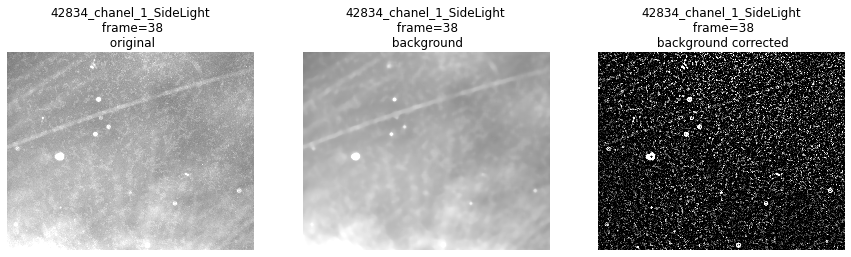

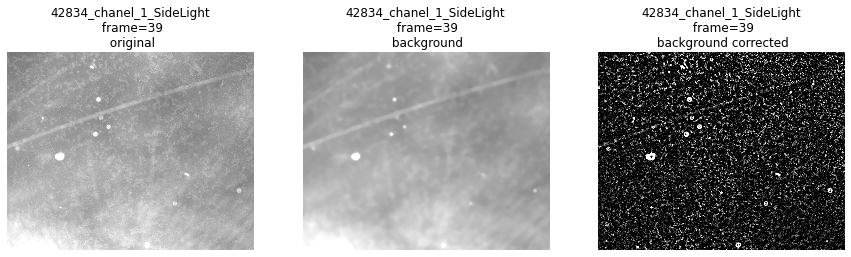

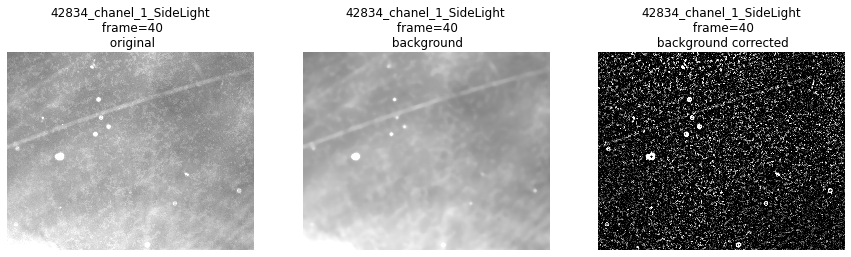

In [ ]:
## plot (original, estimated_background, corrected_background)
def plot_panel(orig,bg,corrected,file_name,frame):
    fig,ax=plt.subplots(nrows=1,ncols=3,figsize=(15,20))
    ax[0].imshow(orig,vmin=0,vmax=np.quantile(orig,0.99))
    ax[1].imshow(bg,vmin=0,vmax=np.quantile(bg,0.99))
    ax[2].imshow(corrected,vmin=0,vmax=np.quantile(corrected,0.99))
    ax[0].set_title(file_name+"\n frame="+str(frame)+"\n original")
    ax[1].set_title(file_name+"\n frame="+str(frame)+"\n background")
    ax[2].set_title(file_name+"\n frame="+str(frame)+"\n background corrected")
    ax[0].axis("off")
    ax[1].axis("off")
    ax[2].axis("off")

    
    
for frame in range(orig.shape[0]):
    plot_panel(orig[frame],bg[frame],corrected_bg[frame],file,frame)

## Plot intensity profiles across central vertical line 

In [ ]:
def plot_vertical_profile(orig,bg,img_corrected,h,file_name,frame):
    fig,ax=plt.subplots(nrows=1,ncols=3,figsize=(16,4))
    ax[0].plot(orig[:,h])
    ax[1].plot(bg[:,h])
    ax[2].plot(img_corrected[:,h])
    
    ax[0].set_title(file_name+"\n frame="+str(frame+1)+"\n original")
    ax[1].set_title(file_name+"\n frame="+str(frame+1)+"\n background")
    ax[2].set_title(file_name+"\n frame="+str(frame+1)+"\n background corrected")
    
central_vertical_line=int(orig.shape[1]/2)
for frame in range(orig.shape[0]):
    plot_vertical_profile(orig[frame],bg[frame],corrected_bg[frame],central_vertical_line,file_name,frame)